# **1.   Import Libraries**

In [1]:
import os
import random
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image

import cv2

import plotly.express as px
import plotly.graph_objects as go

from tqdm import tqdm

# **2. Load Dataset**

In [2]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    print(dirname)

/kaggle/input
/kaggle/input/datasets
/kaggle/input/datasets/kmader
/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000
/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/HAM10000_images_part_1
/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/ham10000_images_part_1
/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/HAM10000_images_part_2
/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/ham10000_images_part_2


In [3]:
metadata = pd.read_csv(
    "/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/HAM10000_metadata.csv"
)

In [4]:

metadata.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [5]:

metadata.tail()

,lesion_id,image_id,dx,dx_type,age,sex,localization
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face
10014,HAM_0003521,ISIC_0032258,mel,histo,70.0,female,back


In [6]:
base_path = "/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000"

print(os.listdir(base_path))

['hmnist_8_8_RGB.csv', 'hmnist_28_28_RGB.csv', 'HAM10000_images_part_1', 'ham10000_images_part_1', 'hmnist_8_8_L.csv', 'HAM10000_images_part_2', 'ham10000_images_part_2', 'hmnist_28_28_L.csv', 'HAM10000_metadata.csv']


In [7]:
image_dirs = [
    "/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/HAM10000_images_part_1",
    "/kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/HAM10000_images_part_2"
]

image_paths = {}

for folder in image_dirs:
    for img in os.listdir(folder):
        image_paths[img[:-4]] = os.path.join(folder, img)

metadata["image_path"] = metadata["image_id"].map(image_paths)

In [8]:
print(metadata.shape)

metadata.head()

metadata.tail()

metadata.info()

(10015, 8)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
 7   image_path    10015 non-null  object 
dtypes: float64(1), object(7)
memory usage: 626.1+ KB


# **3. Dataset Summary**

In [9]:
print("HAM10000 Dataset Summary")
summary = pd.DataFrame({
    "Property": [
        "Dataset Name",
        "Problem Type",
        "Total Images",
        "Classes",
        "Image Format",
        "Metadata Columns",
        "Missing Values",
        "Duplicate Rows"
    ],
    "Value": [
        "HAM10000",
        "Multi-class Skin Lesion Classification",
        len(metadata),
        metadata["dx"].nunique(),
        "JPG",
        metadata.shape[1],
        metadata.isnull().sum().sum(),
        metadata.duplicated().sum()
    ]
})

summary

HAM10000 Dataset Summary


,Property,Value
0,Dataset Name,HAM10000
1,Problem Type,Multi-class Skin Lesion Classification
2,Total Images,10015
3,Classes,7
4,Image Format,JPG
5,Metadata Columns,8
6,Missing Values,57
7,Duplicate Rows,0


# **4. Missing Values**

In [10]:
missing = metadata.isnull().sum().reset_index()
missing.columns = ["Column","Missing Values"]

missing

,Column,Missing Values
0,lesion_id,0
1,image_id,0
2,dx,0
3,dx_type,0
4,age,57
5,sex,0
6,localization,0
7,image_path,0


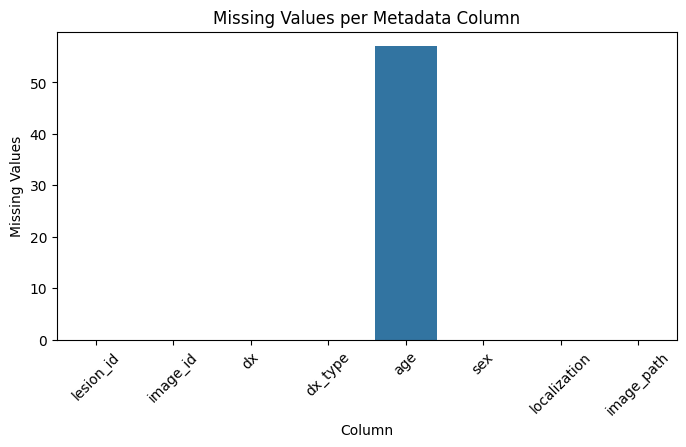

In [11]:
plt.figure(figsize=(8,4))

sns.barplot(
    data=missing,
    x="Column",
    y="Missing Values"
)

plt.title("Missing Values per Metadata Column")
plt.xticks(rotation=45)

plt.show()

# **5 Patient Demographics**

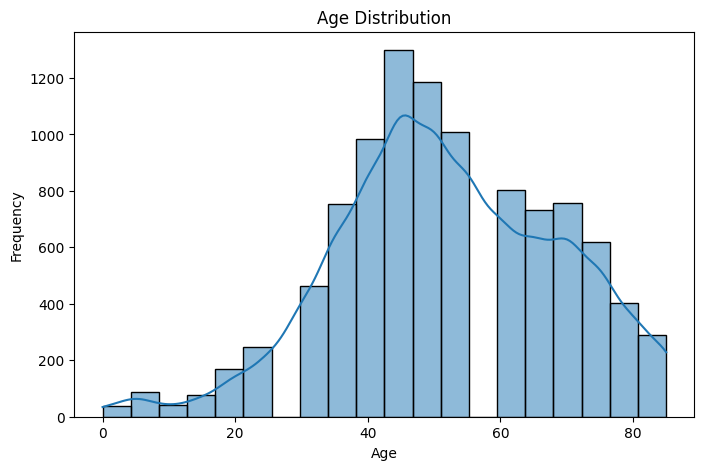

In [12]:
# Age Distribution

plt.figure(figsize=(8,5))

sns.histplot(
    metadata["age"],
    bins=20,
    kde=True
)

plt.title("Age Distribution")
plt.xlabel("Age")
plt.ylabel("Frequency")

plt.show()

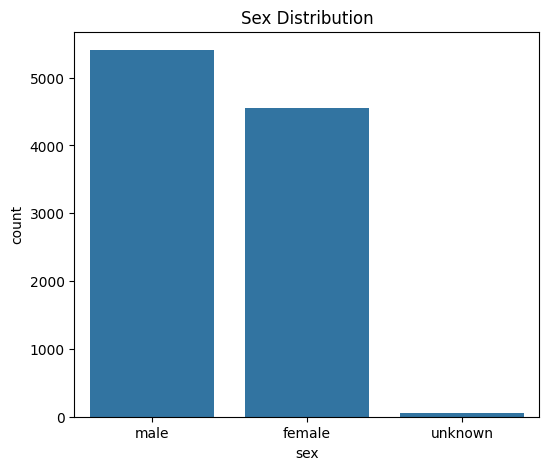

In [13]:
# Sex Distribution

plt.figure(figsize=(6,5))

sns.countplot(
    data=metadata,
    x="sex",
    order=metadata["sex"].value_counts().index
)

plt.title("Sex Distribution")

plt.show()

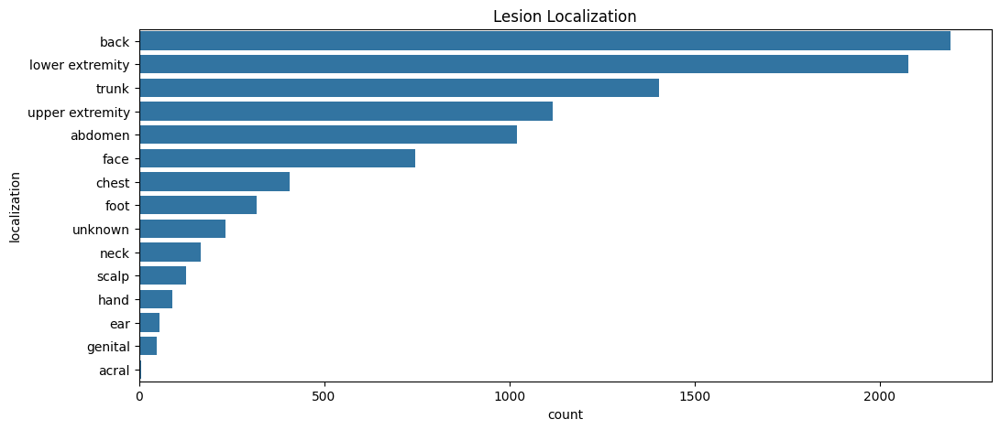

In [14]:
# Lesion Location Distribution

plt.figure(figsize=(12,5))

sns.countplot(
    data=metadata,
    y="localization",
    order=metadata["localization"].value_counts().index
)

plt.title("Lesion Localization")

plt.show()

# **6. Duplicate Lesions**

In [15]:
duplicate_lesions = metadata["lesion_id"].duplicated().sum()

print("Duplicate lesion IDs:", duplicate_lesions)

Duplicate lesion IDs: 2545


In [16]:
metadata["lesion_id"].value_counts().head(10)

lesion_id
HAM_0003789    6
HAM_0005263    6
HAM_0000835    6
HAM_0001863    6
HAM_0000893    5
HAM_0007427    5
HAM_0007343    5
HAM_0002364    5
HAM_0007367    5
HAM_0000889    4
Name: count, dtype: int64

# **7. Class Balance Analysis**

# 7.1 Sample Count in Each Class

In [17]:
class_counts = metadata["dx"].value_counts().sort_values(ascending=False)

class_counts

dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64

# 7.2 Dataset Distribution Summary

In [18]:
class_distribution = pd.DataFrame({
    "Class": class_counts.index,
    "Count": class_counts.values,
    "Percentage": (class_counts.values / len(metadata) * 100).round(2)
})

class_distribution

,Class,Count,Percentage
0,nv,6705,66.95
1,mel,1113,11.11
2,bkl,1099,10.97
3,bcc,514,5.13
4,akiec,327,3.27
5,vasc,142,1.42
6,df,115,1.15


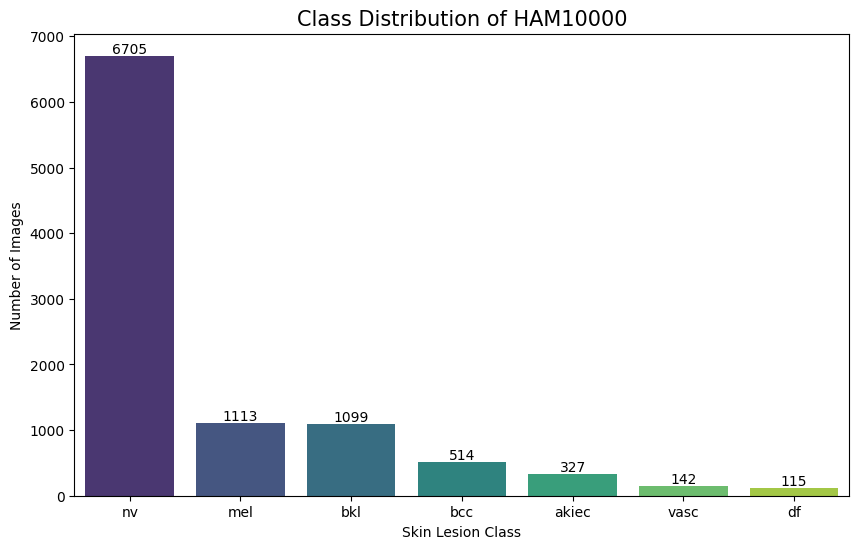

In [19]:
plt.figure(figsize=(10,6))

ax = sns.barplot(
    data=class_distribution,
    x="Class",
    y="Count",
    palette="viridis"
)

# Display values above bars
for i, value in enumerate(class_distribution["Count"]):
    ax.text(i, value + 40, str(value),
            ha='center',
            fontsize=10)

plt.title("Class Distribution of HAM10000", fontsize=15)
plt.xlabel("Skin Lesion Class")
plt.ylabel("Number of Images")

plt.show()

# 7.3 Majority-to-Minority ratio

In [20]:
majority = class_counts.max()
minority = class_counts.min()

ratio = majority / minority

print(f"Majority Class : {class_counts.idxmax()} ({majority})")
print(f"Minority Class : {class_counts.idxmin()} ({minority})")
print(f"Majority-to-Minority Ratio : {ratio:.2f}:1")

Majority Class : nv (6705)
Minority Class : df (115)
Majority-to-Minority Ratio : 58.30:1


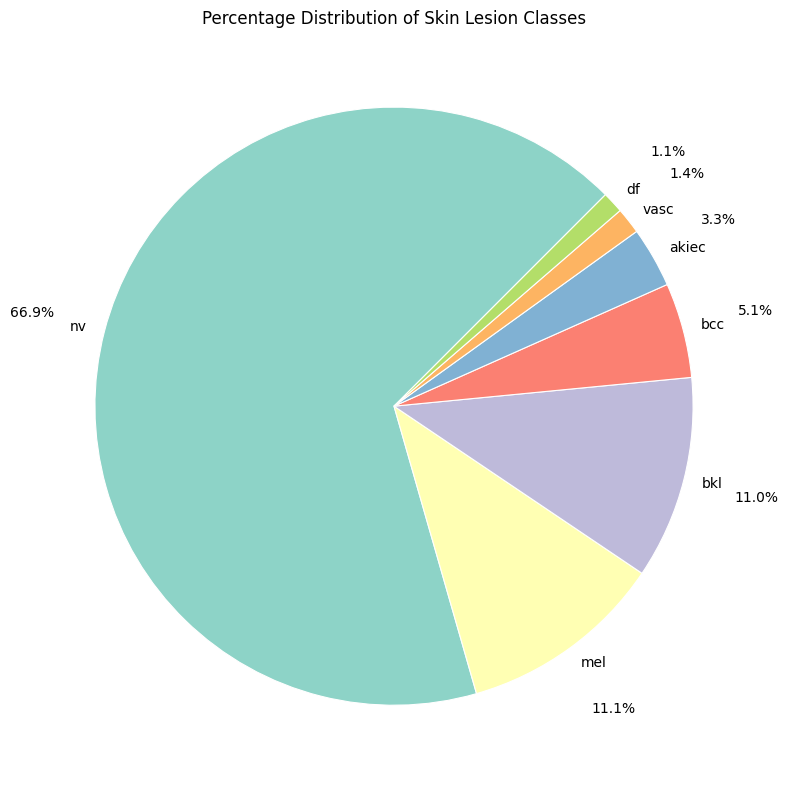

In [81]:
plt.figure(figsize=(8, 8))

plt.pie(
    class_distribution["Count"],
    labels=class_distribution["Class"],
    autopct="%1.1f%%",
    startangle=45,
    colors=plt.cm.Set3.colors,
    pctdistance=1.25,
    labeldistance=1.06,
    wedgeprops={"edgecolor": "white", "linewidth":0.8}
)

plt.title("Percentage Distribution of Skin Lesion Classes")

plt.tight_layout()
plt.show()

In [22]:
import plotly.express as px

fig = px.bar(
    class_distribution,
    x="Class",
    y="Count",
    color="Count",
    text="Count",
    title="Interactive Class Distribution"
)

fig.update_traces(textposition="outside")

fig.show()

# **8. Labelled Sample Grid**

In [23]:
# Full class names
class_names = {
    'akiec': 'Actinic Keratoses',
    'bcc': 'Basal Cell Carcinoma',
    'bkl': 'Benign Keratosis',
    'df': 'Dermatofibroma',
    'mel': 'Melanoma',
    'nv': 'Melanocytic Nevus',
    'vasc': 'Vascular Lesion'
}

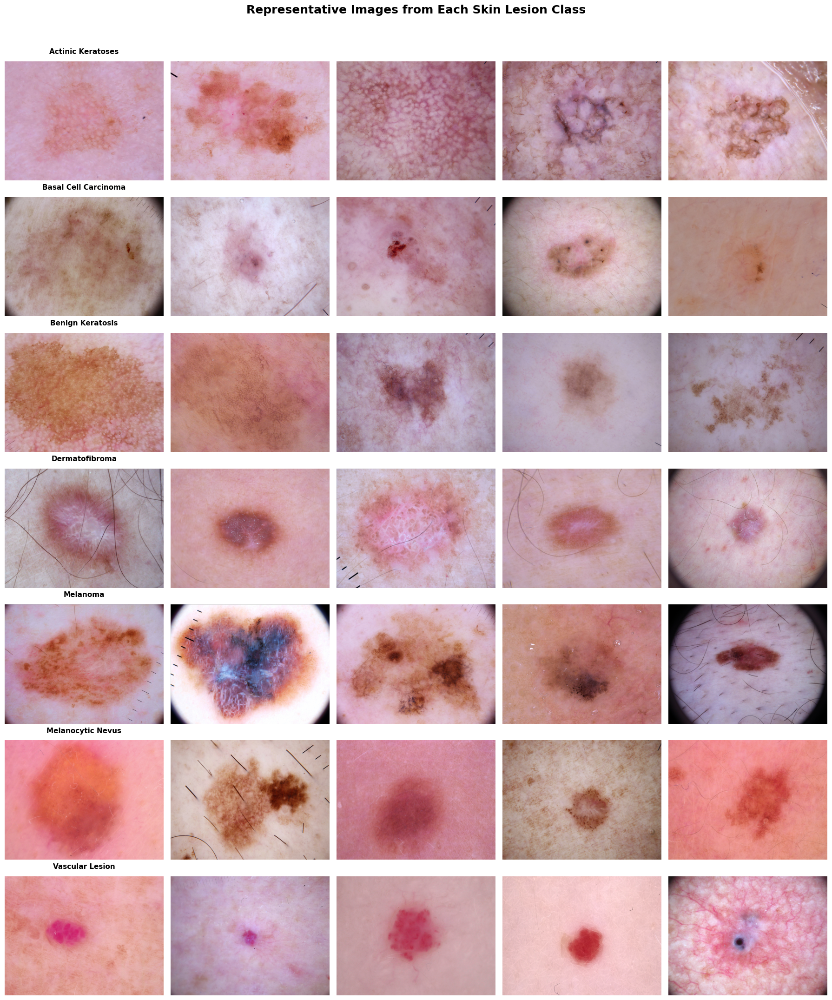

In [24]:
classes = sorted(metadata["dx"].unique())

fig, axes = plt.subplots(len(classes), 5, figsize=(18, 22))

for row, lesion in enumerate(classes):

    samples = metadata[metadata["dx"] == lesion].sample(5, random_state=42)

    for col, (_, sample) in enumerate(samples.iterrows()):

        img = Image.open(sample["image_path"])

        axes[row, col].imshow(img)
        axes[row, col].axis("off")

        if col == 0:
            axes[row, col].set_title(
                class_names[lesion],
                fontsize=11,
                fontweight="bold",
                pad=12
            )

plt.suptitle(
    "Representative Images from Each Skin Lesion Class",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# **9. Image Size & Resolution Analysis**

In [25]:
# Image Dimensions
widths = []
heights = []

for path in metadata["image_path"]:

    img = Image.open(path)

    widths.append(img.width)
    heights.append(img.height)

metadata["width"] = widths
metadata["height"] = heights

In [26]:
metadata[["width", "height"]].describe()

,width,height
count,10015.0,10015.0
mean,600.0,450.0
std,0.0,0.0
min,600.0,450.0
25%,600.0,450.0
50%,600.0,450.0
75%,600.0,450.0
max,600.0,450.0


In [27]:
metadata[["width", "height"]].drop_duplicates()

,width,height
0,600,450


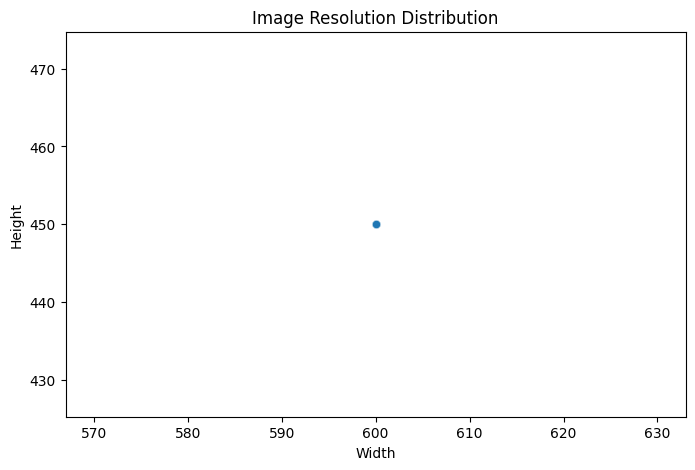

In [28]:
# Resolution Distribution

plt.figure(figsize=(8,5))

sns.scatterplot(
    data=metadata,
    x="width",
    y="height",
    alpha=0.5
)

plt.title("Image Resolution Distribution")
plt.xlabel("Width")
plt.ylabel("Height")

plt.show()

In [29]:
# Resolution Count

resolution_counts = (
    metadata.groupby(["width", "height"])
    .size()
    .reset_index(name="Count")
)

resolution_counts

,width,height,Count
0,600,450,10015


# **10. Pixel & Colour Analysis**

In [30]:
# Lists to store statistics
mean_r, mean_g, mean_b = [], [], []
brightness = []

for path in tqdm(metadata["image_path"]):

    img = Image.open(path).convert("RGB")
    img = np.array(img)

    # Mean value of each channel
    mean_r.append(img[:, :, 0].mean())
    mean_g.append(img[:, :, 1].mean())
    mean_b.append(img[:, :, 2].mean())

    # Overall brightness
    brightness.append(img.mean())

# Add to dataframe
metadata["mean_R"] = mean_r
metadata["mean_G"] = mean_g
metadata["mean_B"] = mean_b
metadata["brightness"] = brightness

100%|██████████| 10015/10015 [01:14<00:00, 133.68it/s]


In [31]:
# Overall RGB Statistics

metadata[["mean_R","mean_G","mean_B","brightness"]].describe().round(2)

,mean_R,mean_G,mean_B,brightness
count,10015.00,10015.00,10015.00,10015.00
mean,194.70,139.26,145.49,159.82
std,25.06,21.86,24.24,19.18
min,63.05,52.03,55.46,63.63
25%,176.61,124.89,129.55,146.79
50%,196.96,139.16,145.32,159.79
75%,213.79,153.51,161.23,172.68
max,254.29,224.03,238.21,231.77


In [32]:
# Average RGB Values

rgb_average = pd.DataFrame({
    "Channel":["Red","Green","Blue"],
    "Mean":[
        metadata["mean_R"].mean(),
        metadata["mean_G"].mean(),
        metadata["mean_B"].mean()
    ]
})

rgb_average

,Channel,Mean
0,Red,194.697906
1,Green,139.262629
2,Blue,145.485255


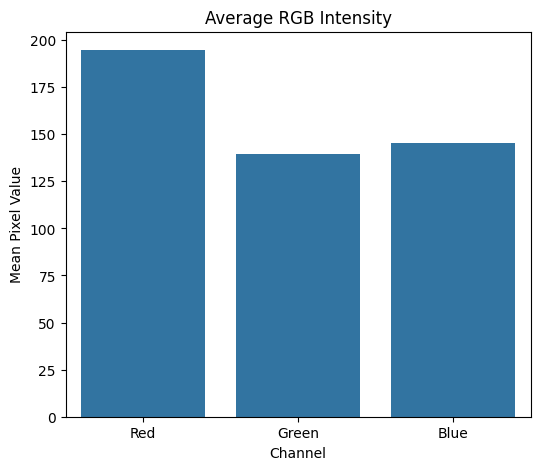

In [33]:
plt.figure(figsize=(6,5))

sns.barplot(
    data=rgb_average,
    x="Channel",
    y="Mean"
)

plt.title("Average RGB Intensity")
plt.ylabel("Mean Pixel Value")

plt.show()

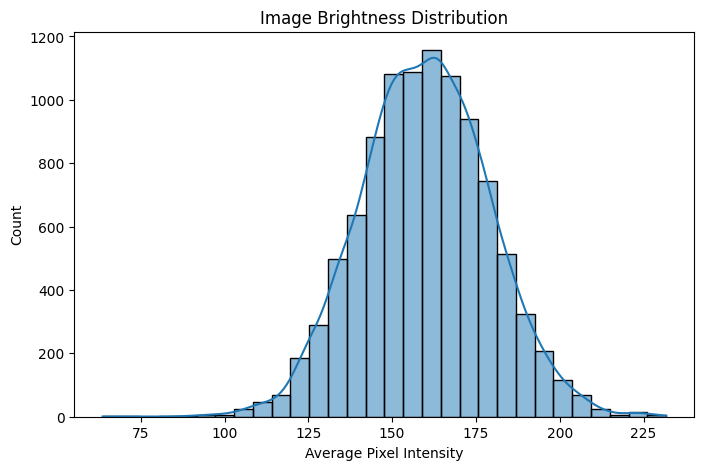

In [34]:
# Brightness Distribution

plt.figure(figsize=(8,5))

sns.histplot(
    metadata["brightness"],
    bins=30,
    kde=True
)

plt.title("Image Brightness Distribution")
plt.xlabel("Average Pixel Intensity")

plt.show()

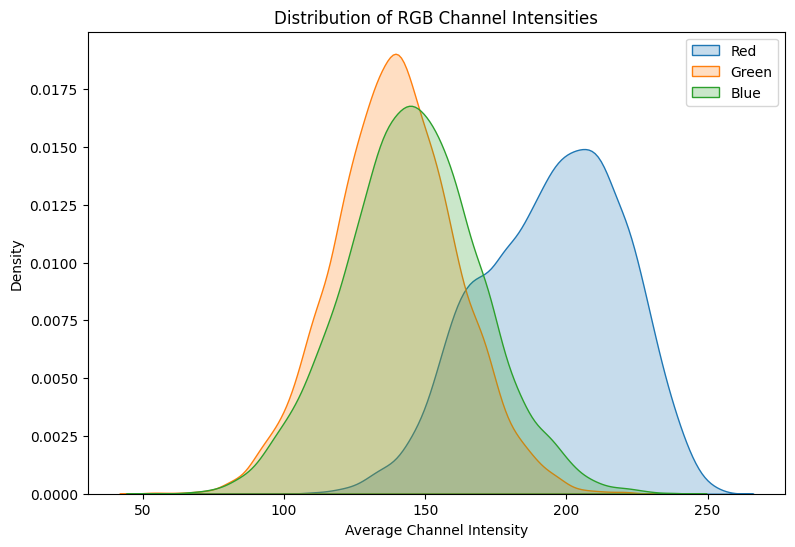

In [35]:
# RGB Channel Distribution

plt.figure(figsize=(9,6))

sns.kdeplot(metadata["mean_R"], label="Red", fill=True)
sns.kdeplot(metadata["mean_G"], label="Green", fill=True)
sns.kdeplot(metadata["mean_B"], label="Blue", fill=True)

plt.title("Distribution of RGB Channel Intensities")
plt.xlabel("Average Channel Intensity")

plt.legend()

plt.show()

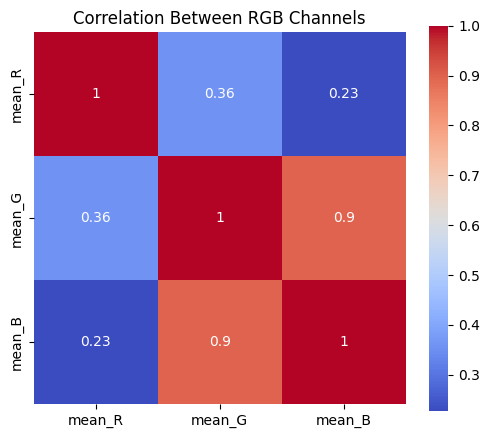

In [36]:
# Correlation Between RGB Channels

plt.figure(figsize=(6,5))

sns.heatmap(
    metadata[["mean_R","mean_G","mean_B"]].corr(),
    annot=True,
    cmap="coolwarm",
    square=True
)

plt.title("Correlation Between RGB Channels")

plt.show()

In [37]:
# Average Colour per Lesion Class

class_rgb = metadata.groupby("dx")[["mean_R","mean_G","mean_B"]].mean().reset_index()

class_rgb

,dx,mean_R,mean_G,mean_B
0,akiec,198.402547,149.135171,154.721517
1,bcc,195.264146,155.760707,162.419955
2,bkl,178.191548,139.449401,147.209999
3,df,198.781621,150.931719,159.224395
4,mel,177.836175,137.950207,144.895852
5,nv,199.829921,137.300231,142.960617
6,vasc,198.397481,148.861650,162.270566


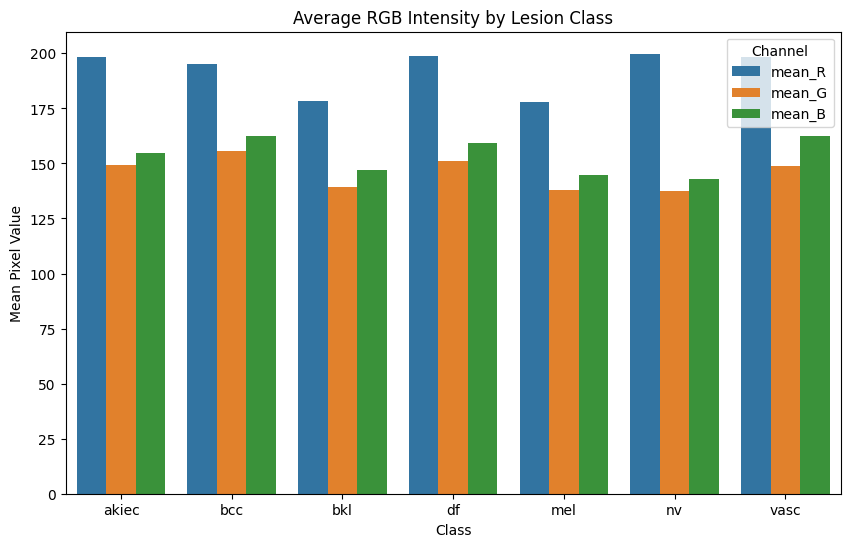

In [38]:
class_rgb_melt = class_rgb.melt(
    id_vars="dx",
    var_name="Channel",
    value_name="Mean"
)

plt.figure(figsize=(10,6))

sns.barplot(
    data=class_rgb_melt,
    x="dx",
    y="Mean",
    hue="Channel"
)

plt.title("Average RGB Intensity by Lesion Class")
plt.xlabel("Class")
plt.ylabel("Mean Pixel Value")

plt.show()

# **11. Image Quality Analysis**

In [39]:
# Blur Detection (Variance of Laplacian)

sharpness = []

for path in tqdm(metadata["image_path"]):

    image = cv2.imread(path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    score = cv2.Laplacian(gray, cv2.CV_64F).var()

    sharpness.append(score)

metadata["sharpness"] = sharpness

100%|██████████| 10015/10015 [01:22<00:00, 120.98it/s]


In [40]:
# Sharpness Statistics

metadata["sharpness"].describe().round(2)

count    10015.00
mean        79.23
std        124.97
min          7.62
25%         34.37
50%         49.24
75%         89.46
max       3825.02
Name: sharpness, dtype: float64

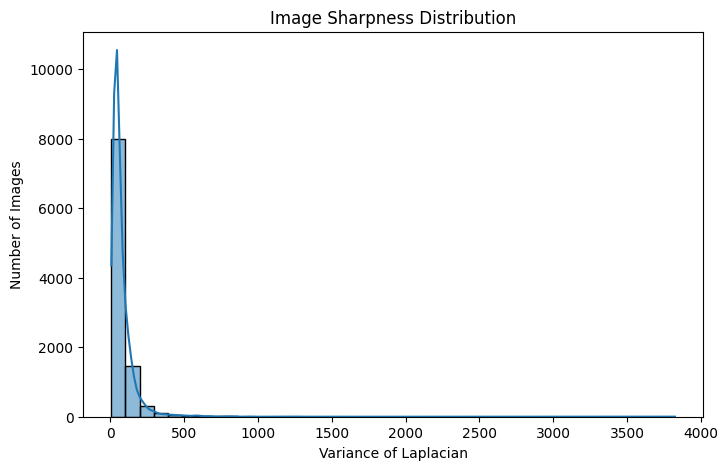

In [41]:
# Sharpness Distribution

plt.figure(figsize=(8,5))

sns.histplot(
    metadata["sharpness"],
    bins=40,
    kde=True
)

plt.title("Image Sharpness Distribution")
plt.xlabel("Variance of Laplacian")
plt.ylabel("Number of Images")

plt.show()

In [42]:
# Contrast Analysis

contrast = []

for path in tqdm(metadata["image_path"]):

    image = cv2.imread(path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    contrast.append(gray.std())

metadata["contrast"] = contrast

100%|██████████| 10015/10015 [01:18<00:00, 127.10it/s]


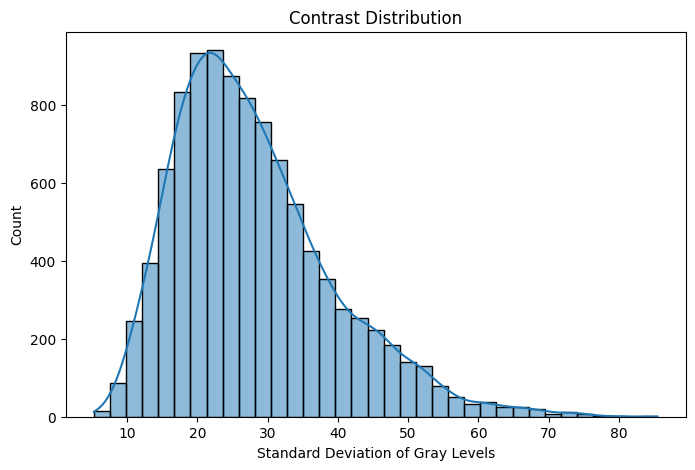

In [43]:
plt.figure(figsize=(8,5))

sns.histplot(
    metadata["contrast"],
    bins=35,
    kde=True
)

plt.title("Contrast Distribution")
plt.xlabel("Standard Deviation of Gray Levels")

plt.show()

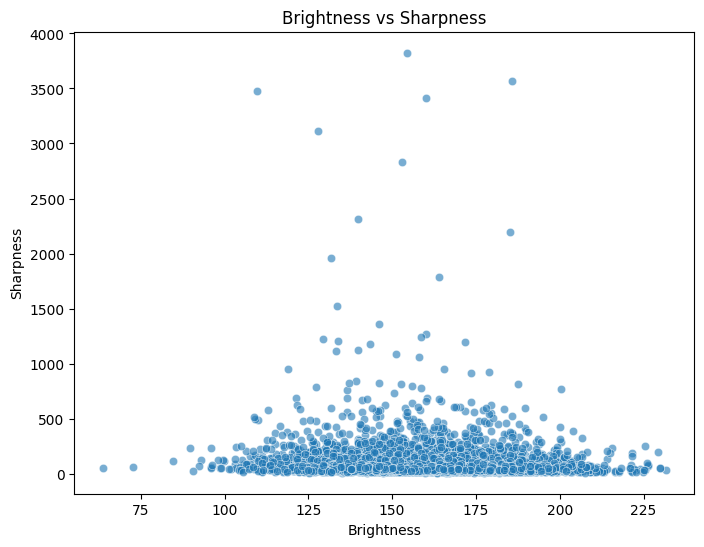

In [44]:
# Brightness Vs Sharpness

plt.figure(figsize=(8,6))

sns.scatterplot(
    data=metadata,
    x="brightness",
    y="sharpness",
    alpha=0.6
)

plt.title("Brightness vs Sharpness")
plt.xlabel("Brightness")
plt.ylabel("Sharpness")

plt.show()

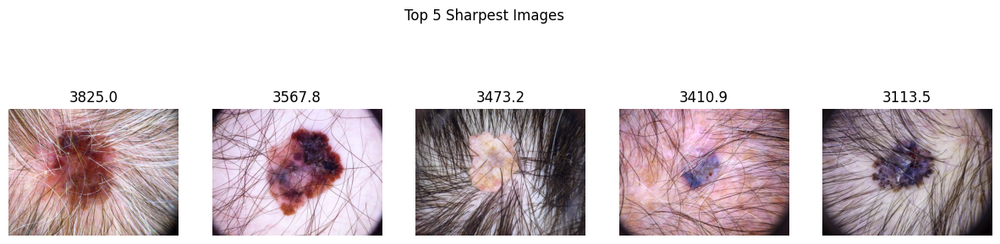

In [45]:
# Display the Sharpest Images

sharpest = metadata.sort_values("sharpness", ascending=False).head(5)

fig, axes = plt.subplots(1,5, figsize=(15,4))

for ax, (_, row) in zip(axes, sharpest.iterrows()):

    img = Image.open(row["image_path"])

    ax.imshow(img)
    ax.set_title(f"{row['sharpness']:.1f}")
    ax.axis("off")

plt.suptitle("Top 5 Sharpest Images")

plt.show()

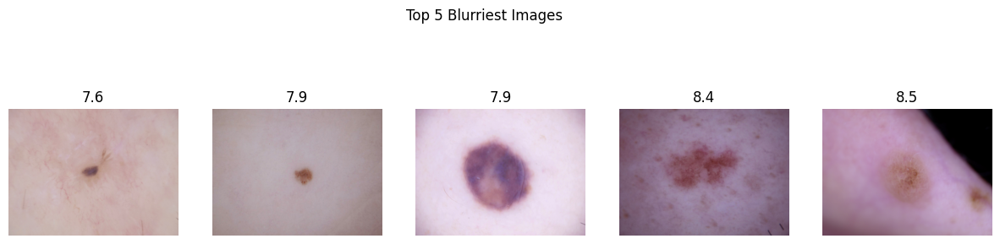

In [46]:
# Display the Blurriest Images

blurriest = metadata.sort_values("sharpness").head(5)

fig, axes = plt.subplots(1,5, figsize=(15,4))

for ax, (_, row) in zip(axes, blurriest.iterrows()):

    img = Image.open(row["image_path"])

    ax.imshow(img)
    ax.set_title(f"{row['sharpness']:.1f}")
    ax.axis("off")

plt.suptitle("Top 5 Blurriest Images")

plt.show()

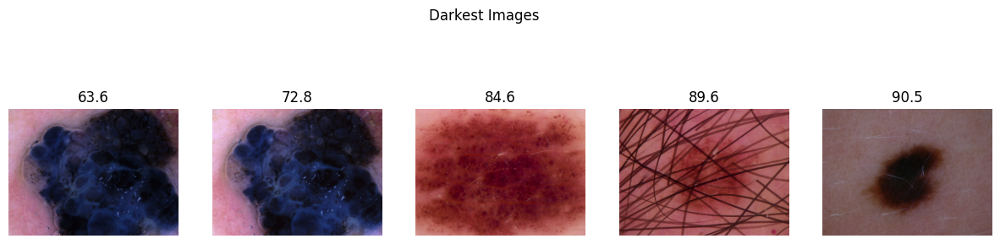

In [47]:
# Find Extremely Dark Images

dark_images = metadata.nsmallest(5, "brightness")

fig, axes = plt.subplots(1,5, figsize=(15,4))

for ax, (_, row) in zip(axes, dark_images.iterrows()):

    img = Image.open(row["image_path"])

    ax.imshow(img)
    ax.set_title(f"{row['brightness']:.1f}")
    ax.axis("off")

plt.suptitle("Darkest Images")

plt.show()

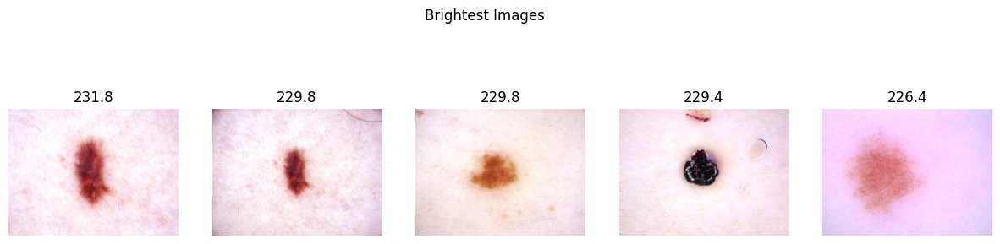

In [48]:
# Find Brightest Images

bright_images = metadata.nlargest(5, "brightness")

fig, axes = plt.subplots(1,5, figsize=(15,4))

for ax, (_, row) in zip(axes, bright_images.iterrows()):

    img = Image.open(row["image_path"])

    ax.imshow(img)
    ax.set_title(f"{row['brightness']:.1f}")
    ax.axis("off")

plt.suptitle("Brightest Images")

plt.show()

# **12. Interactive Visualizations**

In [49]:
import plotly.express as px
import plotly.graph_objects as go

In [50]:
# Class Distribution

fig = px.bar(
    class_distribution,
    x="Class",
    y="Count",
    color="Count",
    text="Count",
    title="Interactive Class Distribution"
)

fig.update_traces(textposition="outside")

fig.update_layout(
    xaxis_title="Lesion Class",
    yaxis_title="Number of Images",
    template="plotly_white"
)

fig.show()

In [51]:
# Age Distribution

fig = px.histogram(
    metadata,
    x="age",
    nbins=25,
    title="Interactive Age Distribution",
    color_discrete_sequence=["steelblue"]
)

fig.update_layout(
    xaxis_title="Age",
    yaxis_title="Number of Patients",
    template="plotly_white"
)

fig.show()

In [52]:
 # Lesion Localization

location_counts = metadata["localization"].value_counts().reset_index()
location_counts.columns = ["Localization", "Count"]

fig = px.bar(
    location_counts,
    x="Localization",
    y="Count",
    color="Count",
    text="Count",
    title="Lesion Localization Distribution"
)

fig.update_traces(textposition="outside")

fig.update_layout(
    xaxis_title="Body Part",
    yaxis_title="Number of Images",
    template="plotly_white"
)

fig.show()

In [53]:
# Brightness vs. Sharpness

fig = px.scatter(
    metadata,
    x="brightness",
    y="sharpness",
    color="dx",
    hover_data=["image_id"],
    title="Brightness vs Sharpness"
)

fig.update_layout(
    xaxis_title="Brightness",
    yaxis_title="Sharpness",
    template="plotly_white"
)

fig.show()

In [54]:
# RGB Distribution

rgb_long = metadata.melt(
    value_vars=["mean_R", "mean_G", "mean_B"],
    var_name="Channel",
    value_name="Intensity"
)

fig = px.box(
    rgb_long,
    x="Channel",
    y="Intensity",
    color="Channel",
    title="RGB Channel Distribution"
)

fig.update_layout(template="plotly_white")

fig.show()

In [55]:
# Correlation Heatmap

corr = metadata[
    ["age", "brightness", "sharpness", "contrast",
     "mean_R", "mean_G", "mean_B"]
].corr()

fig = go.Figure(
    data=go.Heatmap(
        z=corr.values,
        x=corr.columns,
        y=corr.columns,
        colorscale="Viridis",
        text=np.round(corr.values, 2),
        texttemplate="%{text}"
    )
)

fig.update_layout(
    title="Interactive Correlation Heatmap",
    template="plotly_white"
)

fig.show()

# 13. Final EDA Summary

* The HAM10000 dataset contains 10,015 dermoscopic RGB images distributed across seven skin lesion classes.

* The dataset is highly imbalanced, with the Melanocytic Nevus (NV) class accounting for approximately two-thirds of all images, while Dermatofibroma (DF) is the smallest class.

* Most images share a consistent resolution of 600 × 450 pixels, simplifying preprocessing.

* Several lesion classes exhibit strong visual similarities, particularly Melanoma (MEL) and Nevus (NV), which may increase classification difficulty.

* RGB analysis indicates that red is the dominant color channel, consistent with dermoscopic skin images.

* Brightness, contrast, and sharpness analyses show that the majority of images are of acceptable quality, although minor illumination and focus variations exist.

* The exploratory analysis suggests that color, texture, and structural information will all be important for accurate classification.

* The severe class imbalance indicates that imbalance-handling strategies such as weighted loss functions or oversampling should be considered during model development.

* These observations support the use of graph-based representations in later stages, where relationships between image regions can capture structural characteristics beyond conventional pixel-level features.